In [2]:
import numpy as np

# Load the 4 npy files
npy_files = ["all_sims_data_batch_0.npy", "all_sims_data_batch_1.npy", "all_sims_data_batch_2.npy", "all_sims_data_batch_3.npy", "all_sims_data_batch_4.npy", "all_sims_data_batch_5.npy", "all_sims_data_batch_6.npy", "all_sims_data_batch_7.npy", "all_sims_data_batch_8.npy", "all_sims_data_batch_9.npy", "all_sims_data_batch_10.npy", "all_sims_data_batch_11.npy", "all_sims_data_batch_12.npy"]  # Replace with actual filenames
arrays = [np.load(f) for f in npy_files]

# Concatenate along the first axis
final_array = np.concatenate(arrays, axis=0)  # Shape: (512, 20, 128, 128, 5)

# Save the concatenated array
np.save("reshaped_data.npy", final_array)


In [3]:
import json

# List of JSON files
json_files = [
    "sim_data_batch_0.json",
    "sim_data_batch_1.json",
    "sim_data_batch_2.json",
    "sim_data_batch_3.json",
    "sim_data_batch_4.json",
    "sim_data_batch_4.json",
    "sim_data_batch_5.json",
    "sim_data_batch_6.json",
    "sim_data_batch_7.json",
    "sim_data_batch_8.json",
    "sim_data_batch_9.json",
    "sim_data_batch_10.json",
    "sim_data_batch_11.json",
    "sim_data_batch_12.json"
]
hole_location_file = "Hole_Location_384.json"  # Special handling for this file

json_data = []

# Read and merge the first five JSON files
for f in json_files:
    with open(f, "r") as file:
        json_data.extend(json.load(file))  # Extend list to concatenate

# # Read the last JSON file and take only the last 384 entries
# with open(hole_location_file, "r") as file:
#     hole_location_data = json.load(file)[-384:]  # Take last 384 entries

# # Merge hole location data
# json_data.extend(hole_location_data)

# Save the merged JSON file
with open("merged_data.json", "w") as out_file:
    json.dump(json_data, out_file, indent=4)

print(f"Final merged JSON contains {len(json_data)} entries.")  # Debugging step


Final merged JSON contains 1792 entries.


In [10]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
def plot_with_hole_white(
    trajectory, 
    channel_names=["ρ", "Ux", "Uy", "P", "mask"], 
    tol=1e-8
):
    """
    Plot each timestep of a trajectory such that any values whose absolute value
    is below a given tolerance are displayed as white (masked),
    while nonzero data use a normal colormap.

    Args:
        trajectory (np.ndarray): Array of shape (timesteps, height, width, channels).
        channel_names (list): Names for the channels.
        tol (float): Tolerance below which values are masked (shown as white).
    """
    # Create a copy of the viridis colormap
    cmap = matplotlib.cm.get_cmap('viridis').copy()
    # Masked values (those < tol in absolute value) will be plotted as white
    cmap.set_bad(color='white')

    n_timesteps = trajectory.shape[0]
    for t in range(n_timesteps):
        data = trajectory[t]  # shape: (height, width, channels)
        n_channels = data.shape[-1]
        
        fig, axes = plt.subplots(1, n_channels, figsize=(4*n_channels, 4))
        
        for ch in range(n_channels):
            # Mask out values whose absolute value is below 'tol'
            masked_channel = np.ma.masked_where(
                np.abs(data[:, :, ch]) < tol,
                data[:, :, ch]
            )
            
            # If you prefer colorbars to scale based on only the unmasked region:
            valid_vals = data[:, :, ch][np.abs(data[:, :, ch]) >= tol]
            if valid_vals.size > 0:
                vmin, vmax = valid_vals.min(), valid_vals.max()
            else:
                # If everything is below tol (i.e., fully masked), pick a small range
                vmin, vmax = 0, 1
            
            im = axes[ch].imshow(masked_channel, cmap=cmap, vmin=vmin, vmax=vmax)
            axes[ch].set_title(f"{channel_names[ch]} | Timestep {t}")
            axes[ch].axis("off")
            fig.colorbar(im, ax=axes[ch], fraction=0.046, pad=0.04)
        
        plt.tight_layout()
        plt.show()
        plt.close(fig)

/tmp/ipykernel_645382/437628178.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = matplotlib.cm.get_cmap('viridis').copy()


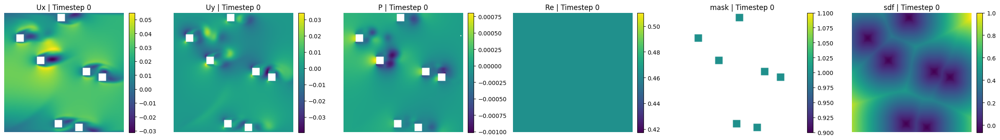

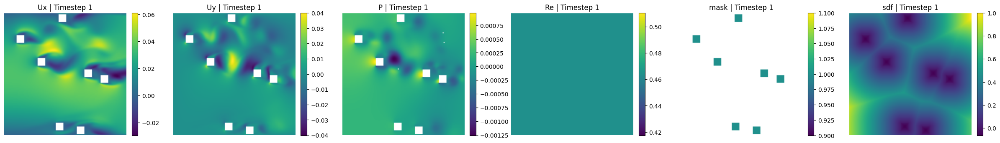

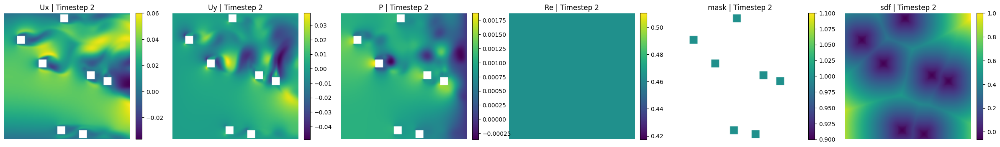

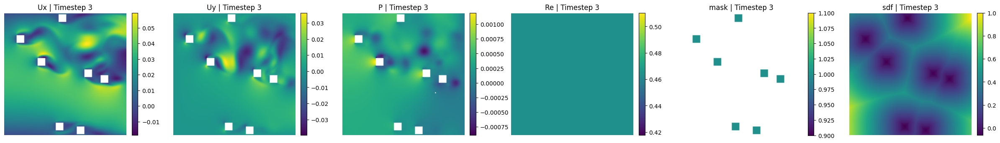

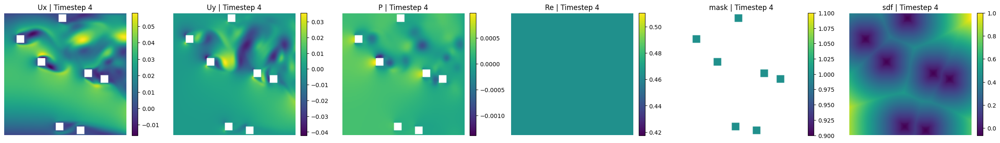

...

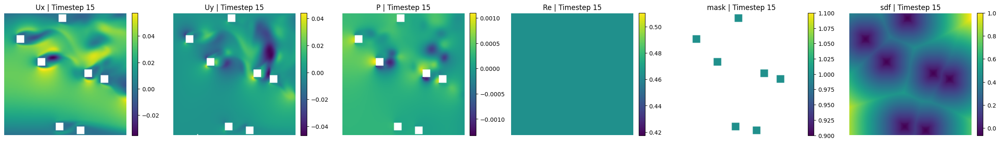

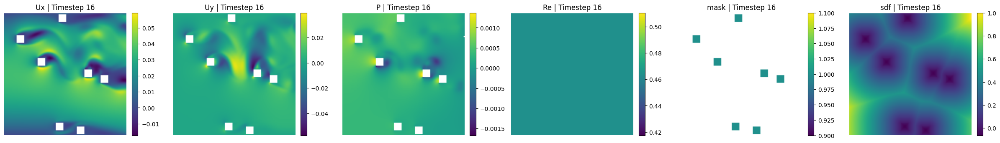

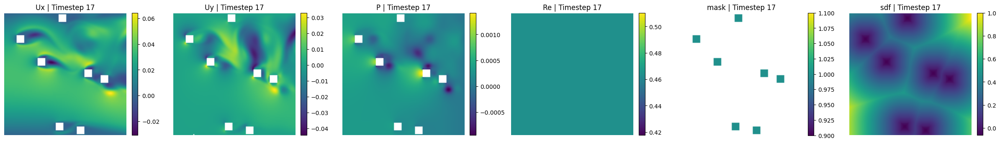

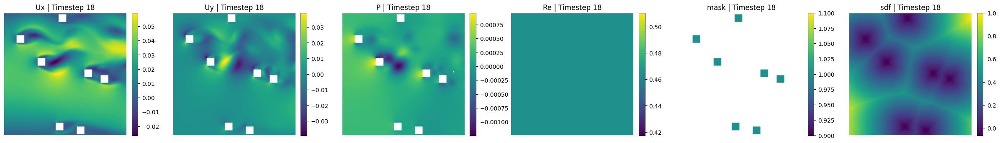

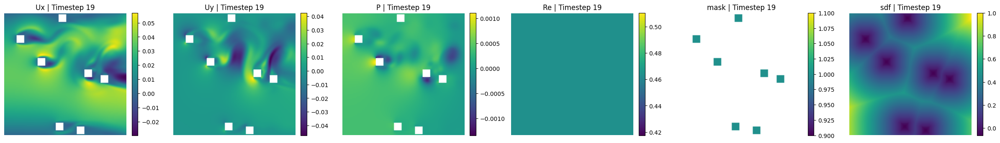

In [11]:
combined_data = np.load("/data/group_data/sage_lab_complex_geometry/FPO_Cylinder_Multiple_Holes_1024.npy")
sample_trajectory = combined_data[0]  # shape: (20,128,128,5)
# sample_timestep = 0
# plot_reshaped_sample(sample_trajectory, sample_timestep, output_folder)
plot_with_hole_white(
sample_trajectory, 
channel_names=["Ux", "Uy", "P", "Re", "mask", "sdf"], 
tol=1e-8
)

First match for Re_scaled ~ 1.000000 at (N=73, T=0, H=0, W=0).


/tmp/ipykernel_645382/893153483.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = matplotlib.cm.get_cmap('gist_ncar').copy()


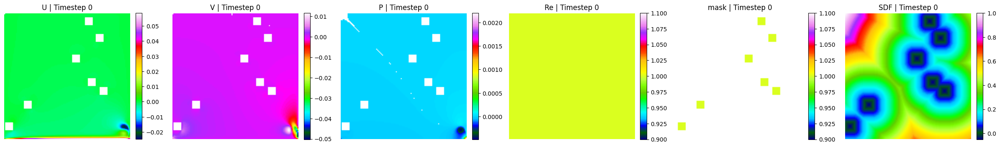

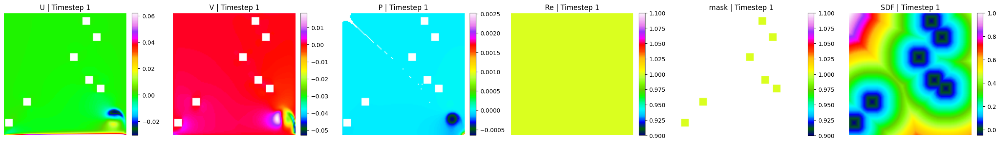

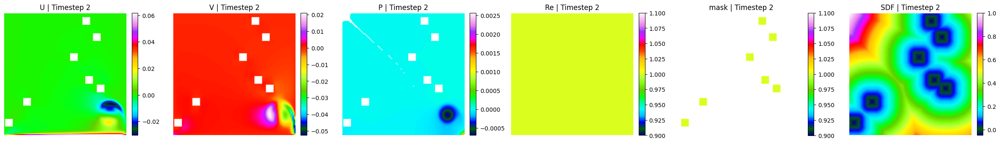

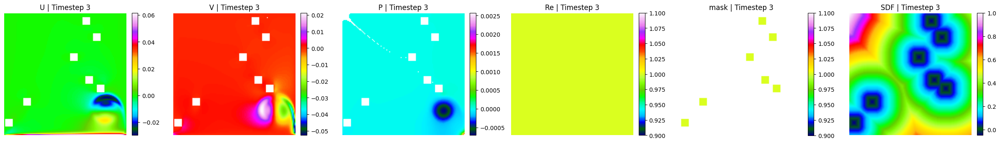

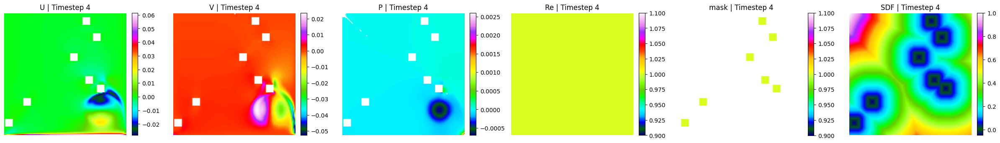

...

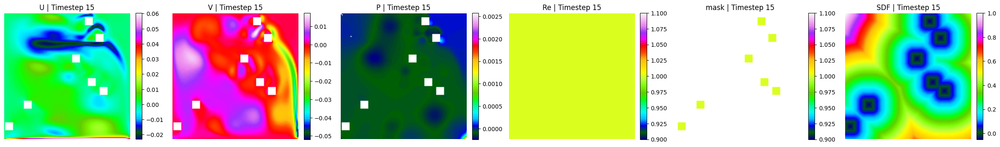

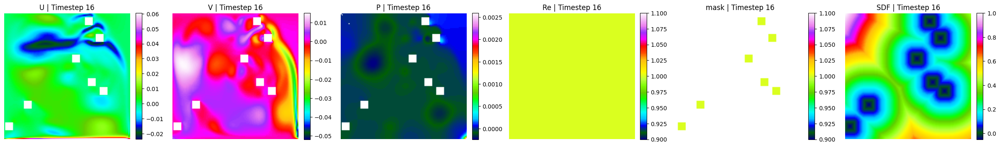

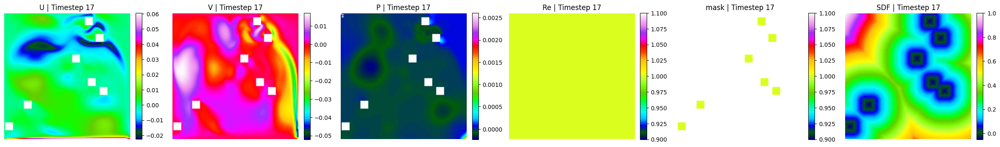

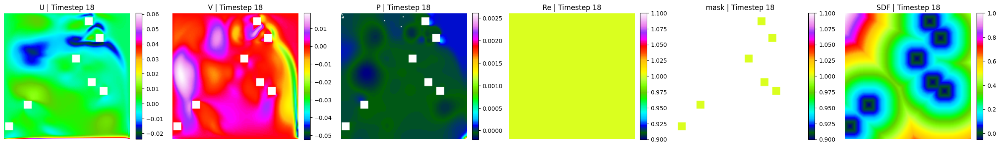

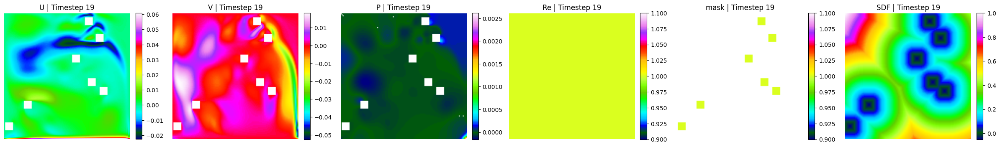

In [16]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

def plot_with_hole_white(
    trajectory, 
    channel_names=["ρ", "Ux", "Uy", "P", "mask"], 
    tol=1e-8
):
    """
    Plot each timestep of a trajectory such that any values whose absolute value
    is below a given tolerance are displayed as white (masked),
    while nonzero data use a normal colormap.

    Args:
        trajectory (np.ndarray): Array of shape (timesteps, height, width, channels).
        channel_names (list): Names for the channels.
        tol (float): Tolerance below which values are masked (shown as white).
    """
    # Create a copy of the viridis colormap
    cmap = matplotlib.cm.get_cmap('gist_ncar').copy()
    # Masked values (those < tol in absolute value) will be plotted as white
    cmap.set_bad(color='white')

    n_timesteps = trajectory.shape[0]
    for t in range(n_timesteps):
        data = trajectory[t]  # shape: (height, width, channels)
        n_channels = data.shape[-1]
        
        fig, axes = plt.subplots(1, n_channels, figsize=(4*n_channels, 4))
        
        for ch in range(n_channels):
            # Mask out values whose absolute value is below 'tol'
            masked_channel = np.ma.masked_where(
                np.abs(data[:, :, ch]) < tol,
                data[:, :, ch]
            )
            
            # Dynamically adjust color range based on unmasked values
            valid_vals = data[:, :, ch][np.abs(data[:, :, ch]) >= tol]
            if valid_vals.size > 0:
                vmin, vmax = valid_vals.min(), valid_vals.max()
            else:
                vmin, vmax = 0, 1
            
            im = axes[ch].imshow(masked_channel, cmap=cmap, vmin=vmin, vmax=vmax)
            axes[ch].set_title(f"{channel_names[ch]} | Timestep {t}")
            axes[ch].axis("off")
            fig.colorbar(im, ax=axes[ch], fraction=0.046, pad=0.04)
        
        plt.tight_layout()
        plt.show()
        plt.close(fig)


# ---------------------------------------------------------
# 1) Load your data & compute the scaled target for Re=1000
# ---------------------------------------------------------
data = np.load("/data/group_data/sage_lab_complex_geometry/final_combined_LDC_Multiple_1024_hole.npy")  # shape: (N, T, H, W, C)
Re_channel = 3  # or whatever index your Re channel is
Re_min_actual = 100.0
Re_max_actual = 10000.0

Re_target_actual = 10000.0
Re_target_scaled = (Re_target_actual - Re_min_actual) / (Re_max_actual - Re_min_actual)
# Re_target_scaled ~ 0.09090909

# ---------------------------------------------------------
# 2) Find where the dataset's Re-channel is ~ that scaled value
# ---------------------------------------------------------
tolerance = 1e-2  # you can tighten or loosen this as needed
mask_target = np.isclose(data[..., Re_channel], Re_target_scaled, atol=tolerance)
indices = np.argwhere(mask_target)

if len(indices) == 0:
    print(
        f"No points found with Re_scaled ≈ {Re_target_scaled:.6f} "
        f"(which corresponds to actual Re ≈ {Re_target_actual:.1f})."
    )
else:
    # Grab the first occurrence
    n_idx, t_idx, h_idx, w_idx = indices[0]
    print(
        f"First match for Re_scaled ~ {Re_target_scaled:.6f} at "
        f"(N={n_idx}, T={t_idx}, H={h_idx}, W={w_idx})."
    )

    # ---------------------------------------------------------
    # 3) Plot the entire (T, H, W, C) block for sample n_idx
    # ---------------------------------------------------------
    sample_trajectory = data[n_idx]  # shape: (T, H, W, C)

    # Update channel names if needed
    channel_names = ["U", "V", "P", "Re", "mask", "SDF"]

    # Plot
    plot_with_hole_white(sample_trajectory, channel_names=channel_names, tol=1e-8)
